# Проект: Поиск по изображениям

## Введение

Профессиональным фотографам часто требуется быстро находить визуальные референсы для съёмок - позы, освещение, настроение, композицию. Сейчас такой поиск выполняется вручную и зачастую на внешних ресурсах, что занимает много времени и снижает активность внутри сервиса.

Создание инструмента поиска референсных фотографий по текстовому описанию позволит пользователю вводить короткое описание сцены и получать подборку снимков с похожим содержанием из базы платформы.

Внедрение такого функционала: 
- упростит подготовку к съёмкам,
- сделает сервис более полезным в рабочем процессе фотографов,
- поспособствует росту вовлечённости.

Пользователи будут дольше остаются в фотохостинге, чаще возвращаются и активнее взаимодействовать с контентом.

## Цель проекта

Создать демонстрационную версию поиска изображений по текстовому описанию.

Для решения задачи будет создана модель, которая будет получать текстовое описание и изображение в векторизованном виде, и на входе показывать близость векторов.

Результат будет представлен в виде функции, которая по текстовому описанию будет выводить наиболее релевантное изображение.

## Юридические ограничения

Поиск не должен выдавать изображения детей до 16 лет.

## Описание данных

**train_dataset.csv**<br>
Содержит пары изображение–описание.<br>
Столбцы:
* image — имя файла изображения,
* query_id — идентификатор описания (image_name#N),
* query_text — текст описания.

У одной картинки может быть много описаний.

**train_images/**<br>
Папка с изображениями, относящимися к обучающей выборке.

**CrowdAnnotations.tsv**<br>
Оценки соответствия от краудсорсеров. <br>

Столбцы:
* имя файла изображения,
* идентификатор описания,
* доля людей, подтвердивших совпадение,
* количество «за»,
* количество «против».

**ExpertAnnotations.tsv**<br>
Оценки соответствия от трёх специалистов.<br>
Столбцы:
* имя файла изображения,
* идентификатор описания,
* 3–5. оценки экспертов (от 1 до 4).

**test_queries.csv**<br>
Тестовые текстовые запросы.<br>
Столбцы:
* query_id,
* query_text,
* image — релевантное изображение.

**test_images.csv**<br>
Таблица с названиями тестовых изображений.<br>
Столбцы:

* image — имя файла изображения для тестирования

**test_images/**<br>
Папка с изображениями для тестирования.



## План исследования
* Загрузка данных
* Предобработка данных
* Анализ данных
* Векторизация
    - Изображения
    - Тексты
* Подготовка датасетов
* Обучение моделей
* Тестирование
* Выводы

## Подготовка рабочего пространства

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import os
from pathlib import Path
from keras.applications.resnet import ResNet50, preprocess_input
from keras.layers import GlobalAveragePooling2D
from keras.models import Model
from tensorflow.keras.preprocessing import image
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import re
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import random
from sklearn.dummy import DummyRegressor

In [2]:
# Импортируем мой модуль для DS с GitHub

# Импортируем библиотеки для загрузки кода, и создания модуля
import requests, types, sys

# Ссылка на мой модуль на GitHub
url = "https://raw.githubusercontent.com/EgorTatarnikov/DS_notes/main/ds_lib_tatarnikov/ds_lib_tatarnikov_25_10_04.py"

# Скачиваем код и проверяем статус
resp = requests.get(url)
resp.raise_for_status()
code = resp.text

# Создаем пустой модуль в памяти
mod = types.ModuleType("ds_lib_tatarnikov")

# Выполняем код в пространстве имён модуля. Все переменные, функции, классы из кода станут атрибутами модуля
exec(code, mod.__dict__)

# Регистрируем модуль в sys.modules
sys.modules["ds_lib_tatarnikov"] = mod

# Импортируем модуль
import ds_lib_tatarnikov as mylib

## 1. Загрузка данных

**1.1 Откроем файлы с данными**

In [3]:
# расположение текстовой информации
train_dataset_path = 'datasets/train_dataset.csv'
test_images_path = 'datasets/test_images.csv'
test_queries_path = 'datasets/test_queries.csv'
crowd_annotations_path = 'datasets/CrowdAnnotations.tsv'
expert_annotations_path = 'datasets/ExpertAnnotations.tsv'

# расположение фотографий
train_img = "datasets/train_images"
test_img = "datasets/test_images"

In [4]:
if os.path.exists(train_dataset_path):
    df_train = pd.read_csv(train_dataset_path)
else:
    print('Данные не загружены')

In [5]:
if os.path.exists(crowd_annotations_path):
    df_crowd_annotations = pd.read_csv(crowd_annotations_path, sep='\t', header=None, names=['image', 'query_id', 'yes_share', 'yes', 'no'])
else:
    print('Данные не загружены')

In [6]:
if os.path.exists(expert_annotations_path):
    df_expert_annotations = pd.read_csv(expert_annotations_path, sep='\t', header=None, names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])
else:
    print('Данные не загружены')

In [7]:
if os.path.exists(test_images_path):
    df_test_images = pd.read_csv(test_images_path)
else:
    print('Данные не загружены')

In [8]:
if os.path.exists(test_queries_path):
    df_test_queries = pd.read_csv(test_queries_path, index_col=[0], sep='|')
else:
    print('Данные не загружены')

**1.2 Изучим информацию о данных**

**df_train**

Информация о тренировочном датасете

In [9]:
mylib.data_overview(df_train, 'с тренировочными данными')

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Таблица с тренировочными данными состоит из 5822 строк и 3 столбцов.
Пропусков нет.


Посмотрим на количество уникальных фотографий в тренировочном датасете.

In [10]:
df_train_csv_names = set(df_train['image'].astype(str))
len(df_train_csv_names)

1000

В тренировочном датасете 1000 фотографий, каждой соответствует несколько описаний.

Посмотрим на количество тренировочных фотографий в папке.

In [11]:
train_folder_names = set(f.name for f in Path(train_img).iterdir() if f.is_file())
len(train_folder_names)

1000

In [12]:
df_train_csv_names - train_folder_names

set()

В папке также 1000 фотографий. Названия файлов в папке и в таблице соответствуют друг другу.

**df_crowd_annotations**

Изучим информацию о таблице с оценками, полученными от простых людей.

In [13]:
mylib.data_overview(df_crowd_annotations, 'с оценками, полученными от простых людей')

,image,query_id,yes_share,yes,no
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   yes_share  47830 non-null  float64
 3   yes        47830 non-null  int64  
 4   no         47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Таблица с оценками, полученными от простых людей состоит из 47830 строк и 5 столбцов.
Пропусков нет.


**df_expert_annotations**

Изучим информацию о таблице с оценками экспертов.

In [14]:
mylib.data_overview(df_expert_annotations, 'с оценками экспертов')

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB

Таблица с оценками экспертов состоит из 5822 строк и 5 столбцов.
Пропусков нет.


Количество строк в таблице с оценками экспертов соответствует тренировочной таблице.

**df_test_images**

Изучим информацию о таблице с названиями тестовых фотографий.

In [15]:
mylib.data_overview(df_test_images, 'с названиями тестовых фотографий')

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes

Таблица с названиями тестовых фотографий состоит из 100 строк и 1 столбца.
Пропусков нет.


Сравним количество фотографий в тренировочном датасете в таблице и папке.

In [16]:
df_test_csv_names = set(df_test_images['image'].astype(str))
len(df_test_csv_names)

100

In [17]:
test_folder_names = set(f.name for f in Path(test_img).iterdir() if f.is_file())
len(test_folder_names)

100

In [18]:
df_test_csv_names - test_folder_names

set()

В тестовой выборке 100 фотографий. Названия файлов в папке и в таблице соответствуют друг другу.

**df_test_queries**

Посмотрим на таблицу с описаниями фотографий тестовой выборки

In [19]:
mylib.data_overview(df_test_queries, 'с описаниями фотографий тестовой выборки', index_col=True)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Таблица с описаниями фотографий тестовой выборки состоит из 500 строк и 4 столбцов, один из которых используется как индексный.
Пропусков нет.


**Фотографии train_images**

Посмотрим примеры фотографий из тренировочной выборки.

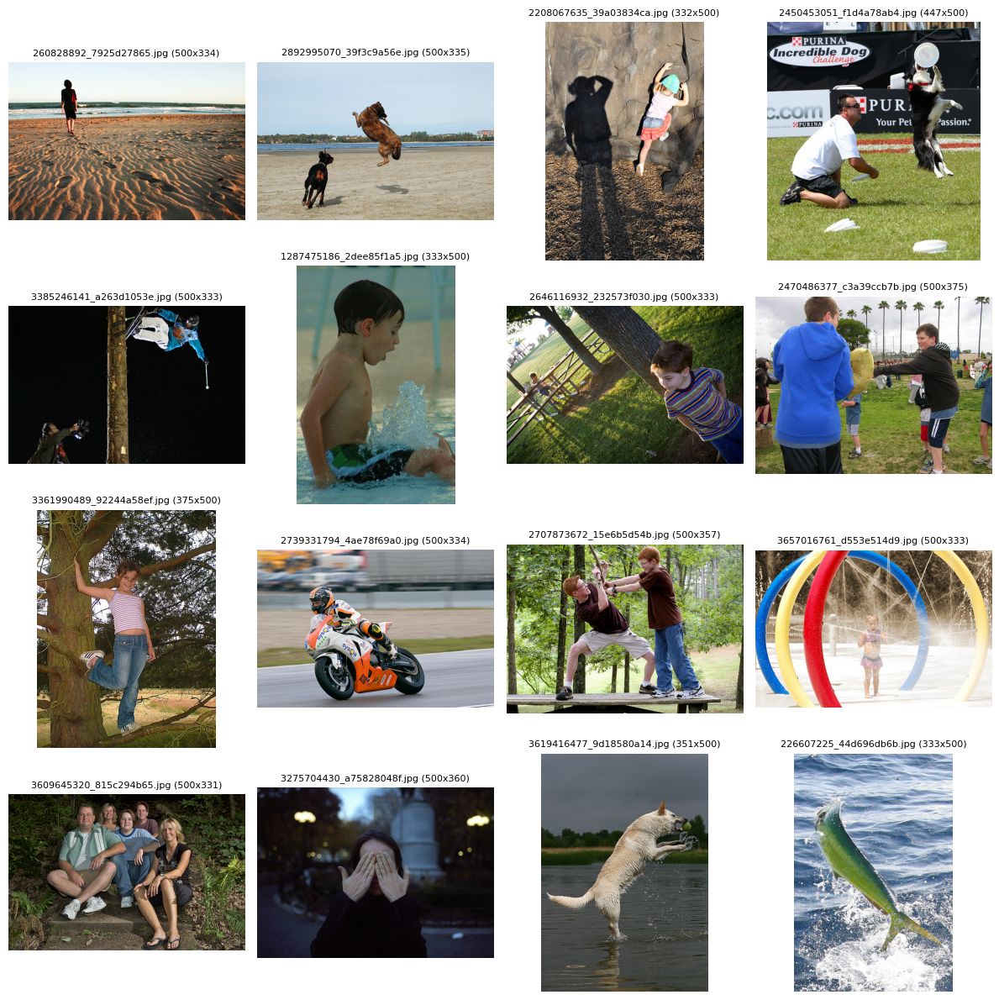

In [20]:
n = 16  # количество случайных картинок
df_train_images = pd.DataFrame({
    "image": df_train["image"].unique()
    })
sample = df_train_images.sample(n, random_state=42)
ncols = 4
nrows = (n + ncols - 1) // ncols

plt.figure(figsize=(12, 12))
for i, (_, row) in enumerate(sample.iterrows()):
    fn = os.path.join(train_img, row['image'])
    try:
        img = Image.open(fn).convert('RGB')
    except Exception as e:
        print("Ошибка открытия", fn, e)
        continue
    width, height = img.size
    plt.subplot(nrows, ncols, i + 1)
    plt.imshow(img)
    plt.title(f"{row['image']} ({width}x{height})", fontsize=8)  # имя + размер
    plt.axis('off')

plt.tight_layout()
plt.show()

**Фотографии test_images**

Посмотрим примеры фотографий из тестовой выборки.

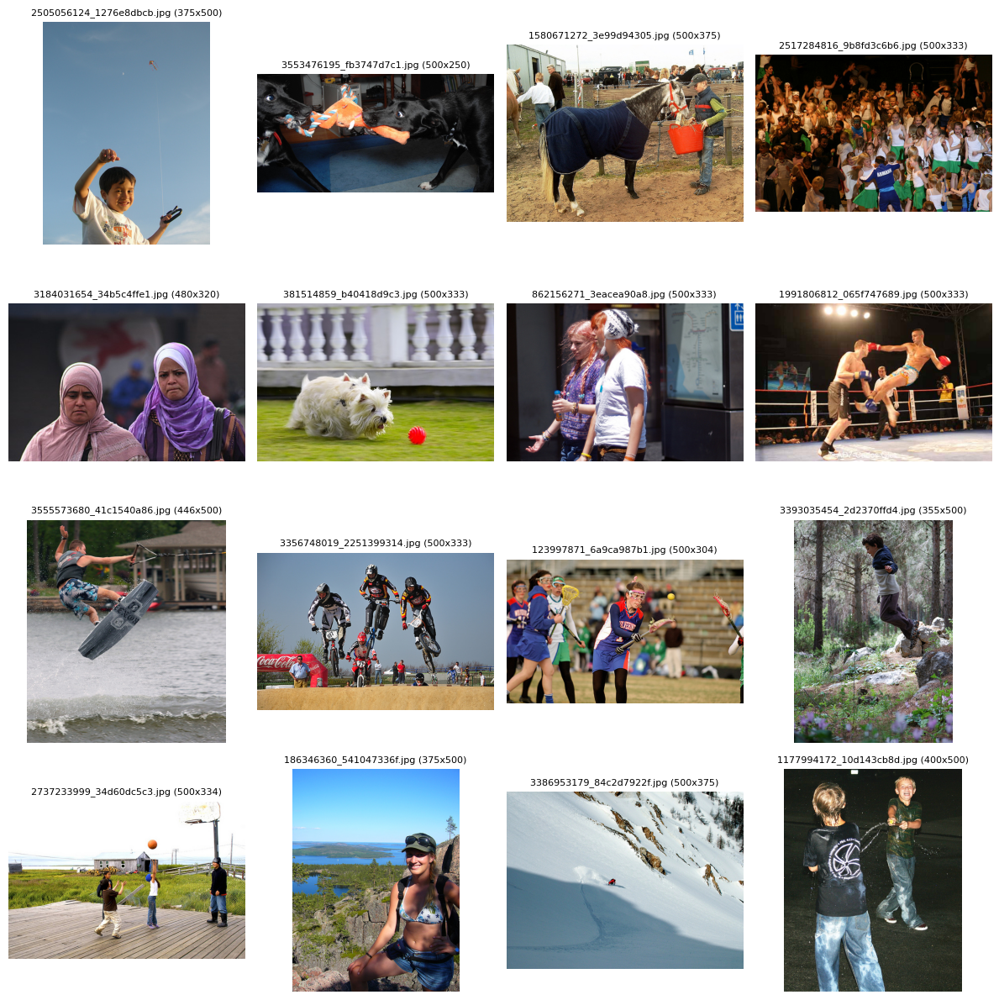

In [21]:
n = 16  # количество случайных картинок
sample = df_test_images.sample(n, random_state=42)
ncols = 4
nrows = (n + ncols - 1) // ncols

plt.figure(figsize=(12, 12))
for i, (_, row) in enumerate(sample.iterrows()):
    fn = os.path.join(test_img, row['image'])
    try:
        img = Image.open(fn).convert('RGB')
    except Exception as e:
        print("Ошибка открытия", fn, e)
        continue
    width, height = img.size
    plt.subplot(nrows, ncols, i + 1)
    plt.imshow(img)
    plt.title(f"{row['image']} ({width}x{height})", fontsize=8)  # имя + размер
    plt.axis('off')

plt.tight_layout()
plt.show()

**Промежуточный итог:**

Данные были успешно загружены. Изучена общая информация о таблицах данных. Пропусков в данных нет. Типы данных соответствуют данным. В тренировочной и тестовой выборке присутствуют фотографии детей, которые нужно будет обработать в соответствии с законодательством.

## 2. Предобработка данных

**2.1 Поиск дубликатов**

Поищем явные дубликаты в таблицах.

In [22]:
print(df_train.duplicated().sum())
print(df_crowd_annotations.duplicated().sum())
print(df_expert_annotations.duplicated().sum())
print(df_test_images.duplicated().sum())
print(df_test_queries.duplicated().sum())

0
0
0
0
0


Явных дубликатов нет.

**2.2 Добавление признаков**

Для таблицы с оценками экспертов найдем среднюю оценку для каждой записи и нормализуем оценку в диапазоне от 0 до 1.

In [23]:
# оценки экспервот в диапазоне от 1 до 4. 
# вычетаем 1 для каждой оценки чтобы сместить в 0.
# складываем и делим на 3 чтобы найти среднее
# делим на 3 чтобы нормализовать в диапазон от 0 до 1
# округляем до 3х знаков после запятой
df_expert_annotations['avg'] = round(((df_expert_annotations['expert_1'] + 
                                       df_expert_annotations['expert_2'] + 
                                       df_expert_annotations['expert_3'] - 3) / 3) / 3, 3) 
df_expert_annotations.head()

,image,query_id,expert_1,expert_2,expert_3,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.111
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.111
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.222
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.111


**2.3 Объединение таблиц**

Объединим обучающую выборку с оценками экспертов и обычных людей.

In [24]:
df_merged = df_train.merge(
    df_crowd_annotations[["image", "query_id", "yes_share"]],
    on=["image", "query_id"],
    how="left"
)

In [25]:
df_merged = df_merged.merge(
    df_expert_annotations[["image", "query_id", "avg"]],
    on=["image", "query_id"],
    how="left"
)

In [26]:
df_merged.head()

,image,query_id,query_text,yes_share,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0,1.000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000


In [27]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   yes_share   2329 non-null   float64
 4   avg         5822 non-null   float64
dtypes: float64(2), object(3)
memory usage: 227.6+ KB


Более половины записей тренировочной выборки не имеют оценки простых людей.

**2.4 Приведение к юридической норме**

Из обучающей выборки, исключим фотографии с детьми. 

Слова, обозначающие детей:

In [28]:
children_keywords = [
    "baby", "boy", "boys", "child", "children", "girl", "girls", 
    "kid", "kids", "toddler"
]

Сначала пройдемся по всем записям и оценим каждое описание на соответствие норме. Названия запрещенных фотографий будем записывать в отдельную коллекцию.

In [29]:
ban_names = set()

In [30]:
def check_row(r):
    text = r['query_text'].lower()
    for word in children_keywords:
        if word in text:
            ban_names.add(r['query_id'][:-2])
    return 1
df_merged.apply(check_row, axis=1);

Вторым проходом отметим запрещенные фотографии в дополнительной столбце 'ban'.

In [31]:
def check_row(r):
    text = r['query_text'].lower()
    for name in ban_names:
        if name == r['image']:
            return True
    return False   
df_merged['ban'] = df_merged.apply(check_row, axis=1)

In [32]:
df_merged.head()

,image,query_id,query_text,yes_share,avg,ban
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.000,False
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000,False
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.222,True
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0,1.000,True
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000,False


Удалим из обучающего датасета все запрещенные записи

In [33]:
df_clean = df_merged[df_merged['ban'] == False].drop('ban', axis=1).reset_index(drop=True)
df_clean.head()

,image,query_id,query_text,yes_share,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0


In [34]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4080 entries, 0 to 4079
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4080 non-null   object 
 1   query_id    4080 non-null   object 
 2   query_text  4080 non-null   object 
 3   yes_share   1743 non-null   float64
 4   avg         4080 non-null   float64
dtypes: float64(2), object(3)
memory usage: 159.5+ KB


**Промежуточный итог:**

На этапе предобработки данные были проверены на наличие дубликатов. Обучающая выборка объединена в единый датасет. Создан признак, обозначчающий среднюю оценку экспертов. Данные очищенны в соответствии с нормами законодательства.

## 3. Исследовательский анализ

**3.1 Размеры фотографий**

Посмотрим на размеры фотографий в тренировочном датасете

In [35]:
sizes = []
for fn in df_train_images['image'].tolist():
    path = os.path.join(train_img, fn)
    try:
        with Image.open(path) as im:
            sizes.append(im.size)  # (width, height)
    except:
        pass

sizes_df = pd.DataFrame(sizes, columns=['width','height'])
sizes_df['aspect ratio'] = sizes_df['width'] / sizes_df['height']
sizes_df.describe()

,width,height,aspect ratio
count,1000.000000,1000.00000,1000.000000
mean,455.913000,398.28300,1.210680
std,69.787346,75.07917,0.358629
min,200.000000,166.00000,0.400000
25%,379.500000,333.00000,0.760000
50%,500.000000,375.00000,1.333333
75%,500.000000,500.00000,1.501502
max,500.000000,500.00000,3.012048


В тренировочном наборе представленны фотографии с размерами от 166 до 500 пикселей по высоте и ширине. Большинство фотографий вытянуты вширь с соотношением сторон примерно 3 на 4.

Посмотрим на размеры фотографий в тестовом датасете.

In [36]:
sizes = []
for fn in df_test_images['image'].tolist():
    path = os.path.join(test_img, fn)
    try:
        with Image.open(path) as im:
            sizes.append(im.size)  # (width, height)
    except:
        pass

sizes_df = pd.DataFrame(sizes, columns=['width','height'])
sizes_df['aspect ratio'] = sizes_df['width'] / sizes_df['height']
sizes_df.describe()

,width,height,aspect ratio
count,100.000000,100.000000,100.000000
mean,461.440000,386.420000,1.257528
std,64.768948,73.972583,0.342356
min,307.000000,240.000000,0.614000
25%,400.000000,333.000000,0.869000
50%,500.000000,375.000000,1.333333
75%,500.000000,500.000000,1.501502
max,500.000000,500.000000,2.000000


Фотографии тестовой выборки соответствуют по размеру тренировочным фотографиям.

**3.2 Распределение оценок**

Выведем общую описательную статистику.

In [37]:
df_clean.describe()

,yes_share,avg
count,1743.000000,4080.000000
mean,0.222729,0.238329
std,0.355531,0.282605
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.111000
75%,0.333333,0.333000
max,1.000000,1.000000


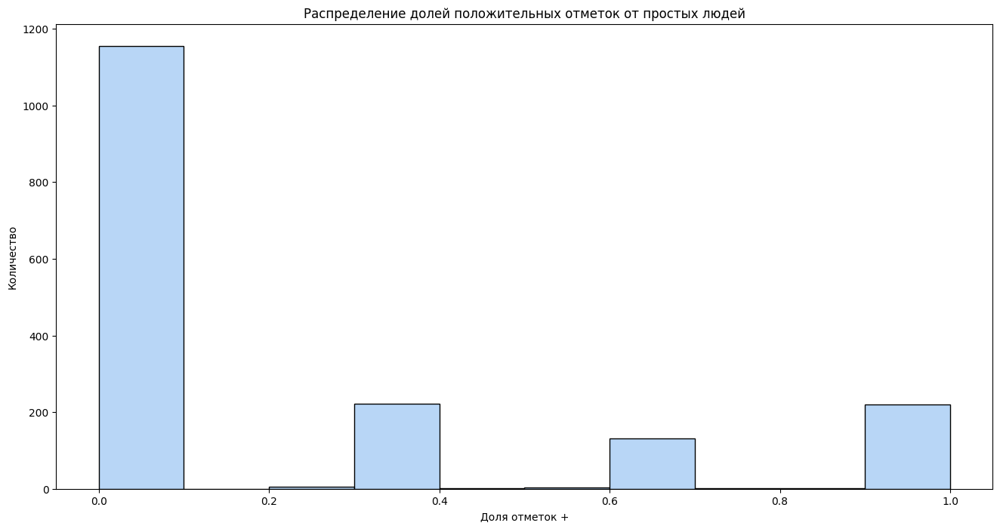

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))

sns.histplot(
    x='yes_share',
    data=df_clean,
    color='#a1c9f4',
    bins=10
)

plt.xlabel('Доля отметок +')
plt.ylabel('Количество')
plt.title('Распределение долей положительных отметок от простых людей')

plt.show()

Имеется четыре наиболее популярных доли положительных оценок: 0,0, 0,33, 0,67 и 1,0. Большая часть оценок 0.

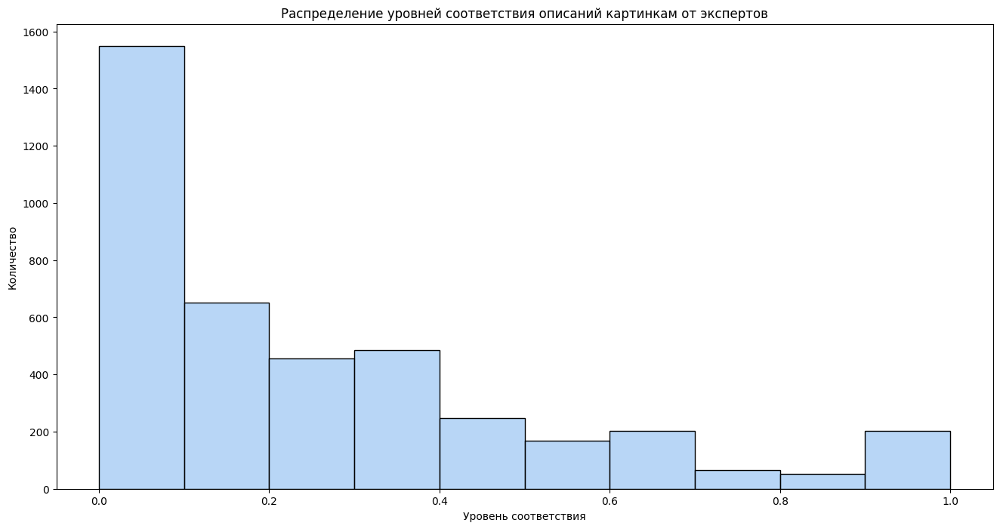

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))

sns.histplot(
    x='avg',
    data=df_clean,
    color='#a1c9f4',
    bins=10    
)

plt.xlabel('Уровень соответствия')
plt.ylabel('Количество')
plt.title('Распределение уровней соответствия описаний картинкам от экспертов')

plt.show()

Распределение оценок экспертов повторяет распределение оценок простых людей. Имеется 10 уровней соответствия описаний картинкам. (Количество корзин в гистограмме было побобрано под количество уровней).

Учтем, что в столбце с ответами простых людей есть пропуски. Построим гистограмму.

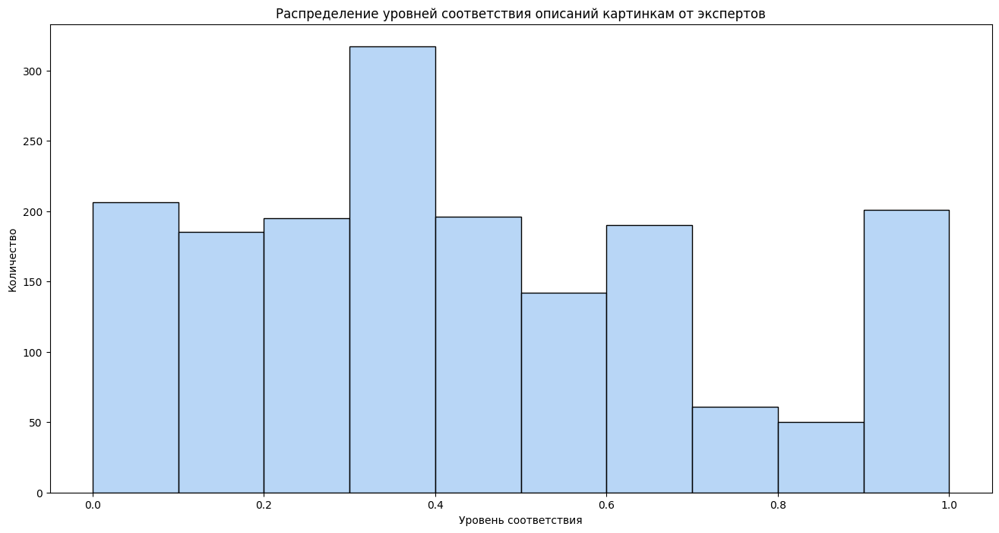

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))

sns.histplot(
    x='avg',
    data=df_clean[df_clean['yes_share'].notna()],
    color='#a1c9f4',
    bins=10    
)

plt.xlabel('Уровень соответствия')
plt.ylabel('Количество')
plt.title('Распределение уровней соответствия описаний картинкам от экспертов')

plt.show()

Распределение оценок экспертов более равномерное, меньше нулевых оценок.

**3.3 Сравнение оценок простых людей и экспертов**

Выведем несколько фотографий, у которых разные оценки простых людей и экспертов.

In [41]:
df_images = df_clean[df_clean['yes_share'].notna()]
df_images = df_images[(df_images['avg'] - df_images['yes_share']).abs() > 0.3]

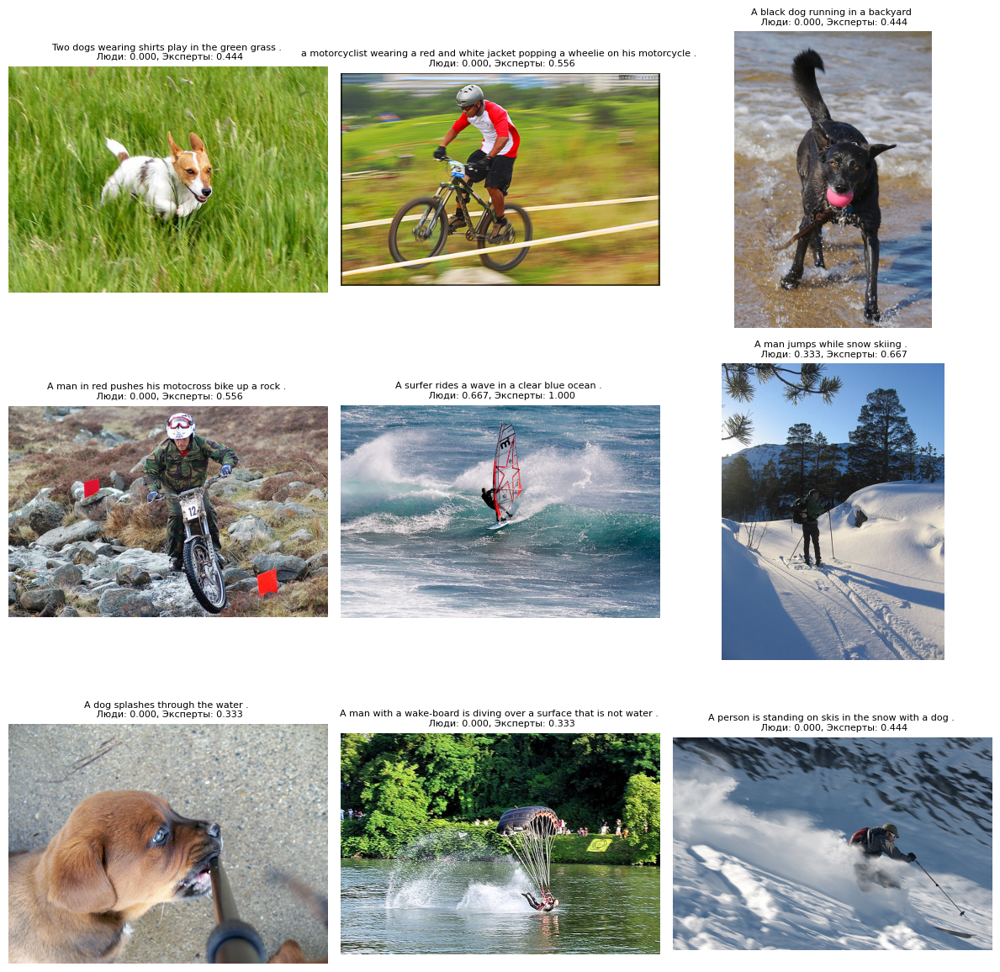

In [42]:
n = 9  # количество случайных картинок
sample = df_images.sample(n, random_state=42)
ncols = 3
nrows = (n + ncols - 1) // ncols

plt.figure(figsize=(12, 12))
for i, (_, row) in enumerate(sample.iterrows()):
    fn = os.path.join(train_img, row['image'])
    try:
        img = Image.open(fn).convert('RGB')
    except Exception as e:
        print("Ошибка открытия", fn, e)
        continue
    plt.subplot(nrows, ncols, i + 1)
    plt.imshow(img)
    plt.title(f"{row['query_text']} \n Люди: {row['yes_share']:.3f}, Эксперты: {row['avg']:.3f}", fontsize=8)  # имя + размер
    plt.axis('off')

plt.tight_layout()
plt.show()

Экспертная разметка фотографий является более качественной благодаря тому, что у эспертов имеется диапазон оценок между 0 и 1. Простые люди ставят 0, даже когда модель частично выполняет запрос. К примеру по запросу "A black dog running in a backyard" представлена картинка с черной собакой на морском побережье (верхний правый угол). Эксперты поставили 0.444, а простые люди 0. В данном случае по экспертной оценке модель сможет чему то научиться, а оценке простых людей не сможет. Оценка 0 только навредит модели.

**Промежуточный итог:**

Фотографии размером около 300–500 пикселей с соотношением сторон 3:4 будут нормально обрабатываться моделью ResNet50, которая обучалась на изображениях 224×224 пикселей.

Краудфаундинговые оценки хуже отражают соответствие картинки запросу. Оставим в обучающей выборке только оценки экспертов.

## 4. Векторизация информации

### 4.1 Векторизация изображений

In [43]:
# 1. Модель-экстрактор (ResNet50 -> 2048 dims)
def create_feature_extractor():
    base = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=(224, 224, 3)
    )
    x = GlobalAveragePooling2D()(base.output)
    return Model(inputs=base.input, outputs=x)

extractor = create_feature_extractor()

In [44]:
# 2. Функция загрузки изображений
def load_image(path):
    img = image.load_img(path, target_size=(224, 224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    return img

Тренировочная выборка

In [45]:
df_train_images = df_clean["image"].unique()
embeddings = []

In [46]:
# 3. Создание эмбеддингов с прогресс-баром
for path in tqdm(df_train_images, desc="Vectorizing images"):
    img = load_image(train_img + '/' + path)
    vec = extractor.predict(img, verbose=0)[0]
    embeddings.append(vec)

Vectorizing images: 100%|████████████████████████████████████████████████████████████| 709/709 [00:57<00:00, 12.44it/s]


In [47]:
# 4. Добавляем в DataFrame
df_train_images = pd.DataFrame({
    "image": df_train_images
    })
df_train_images["embedding"] = embeddings

In [48]:
df_train_clean = df_clean.merge(
    df_train_images[["image", "embedding"]],
    on=["image"],
    how="left"
)

In [49]:
df_train_clean.head()

,image,query_id,query_text,yes_share,avg,embedding
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.08656627, 0.0011652878, 0.0, 2.4696379, 0.0..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.3020404, 0.39192832, 0.26456383, 0.13801533..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.786643, 0.14807294, 0.0, 0.5837573, 0.30666..."
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.08265757, 1.5919145, 0.14580053, 2.6117816,..."
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.054532196, 1.0223408, 0.0055639124, 0.50295..."


Тестовая выборка

In [50]:
embeddings = []

In [51]:
for path in tqdm(df_test_images['image'], desc="Vectorizing images"):
    img = load_image(test_img + '/' + path)
    vec = extractor.predict(img, verbose=0)[0]
    embeddings.append(vec)

Vectorizing images: 100%|████████████████████████████████████████████████████████████| 100/100 [00:08<00:00, 12.20it/s]


In [52]:
df_test_images["embedding"] = embeddings

In [53]:
df_test_images.head()

,image,embedding
0,3356748019_2251399314.jpg,"[0.4423791, 1.1423404, 0.15261851, 0.032466423..."
1,2887171449_f54a2b9f39.jpg,"[0.6420515, 1.5804183, 0.36541966, 1.7737722, ..."
2,3089107423_81a24eaf18.jpg,"[0.22826156, 1.7111907, 0.063031755, 0.3391114..."
3,1429546659_44cb09cbe2.jpg,"[0.15964319, 0.7465723, 0.08305244, 0.0292152,..."
4,1177994172_10d143cb8d.jpg,"[0.27217448, 1.5763917, 0.027585331, 0.3004763..."


**Проверка векторизации изображений**

Выведем несколько рядов фотографий. В каждом ряде фотография справа является референсной, фотографии слева наиболее близкие к ней по косинусному сходству.

In [54]:
def cos(a, b):
    return float(cosine_similarity(a.reshape(1,-1), b.reshape(1,-1))[0][0])

In [55]:
def closest(img_name, k=5):
    v = df_train_images[df_train_images['image']==img_name]['embedding'].iloc[0]

    sims = []
    for i, row in df_train_images.iterrows():
        sims.append((row['image'], cos(v, row['embedding'])))

    sims = sorted(sims, key=lambda x: x[1], reverse=True)
    return sims[:k]

In [56]:
def show_similar(k=5):
    img_name = df_train_images['image'].sample(1).iloc[0]
    top = closest(img_name, k)

    plt.figure(figsize=(16,6))
    for i, (name, score) in enumerate(top):
        fn = os.path.join(train_img, name)
        img = Image.open(fn).convert('RGB')

        plt.subplot(1, k, i+1)
        plt.imshow(img)
        plt.title(f"{score:.2f}", fontsize=8)
        plt.axis('off')

    plt.show()

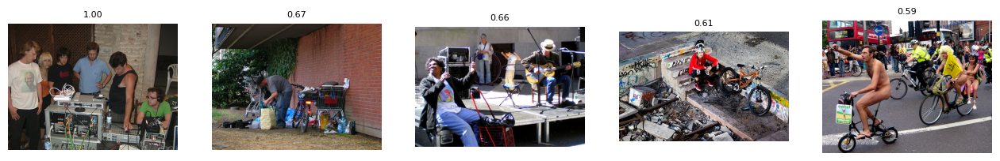

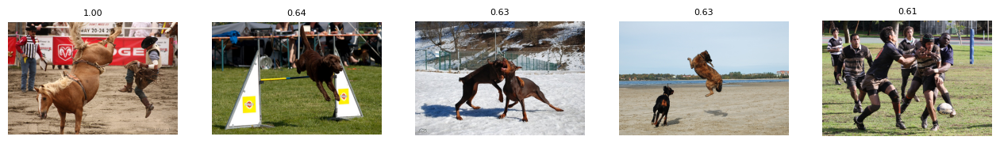

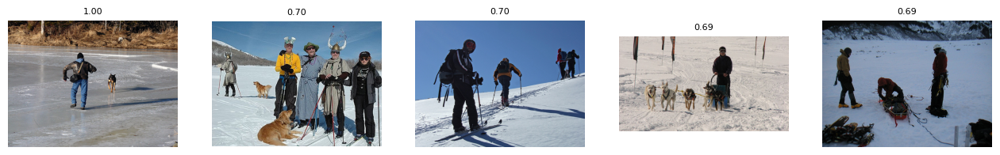

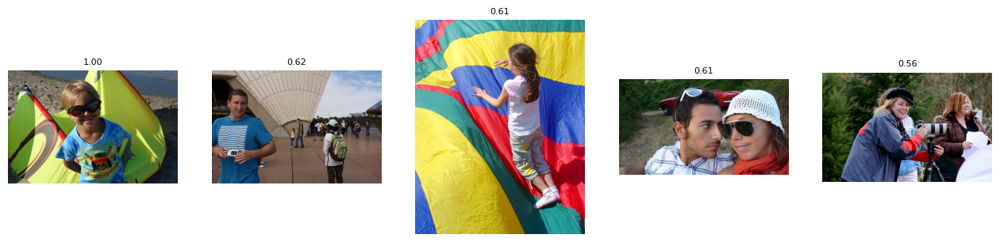

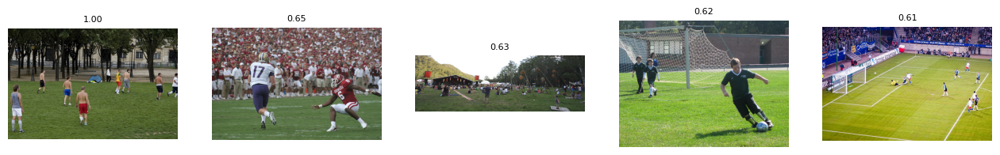

In [57]:
for i in range(5):
    show_similar()

Визуальная оценка схожести фотографий говорит о том, что векторизация изображений произведена правильно. 

### 4.2 Векторизация текста. TF-IDF

Очистка текста

In [58]:
def clear_text(text):
    text = re.sub(r'[^a-zA-Z\s]', ' ', text)  # оставляем только латинские буквы и пробелы
    text = text.lower()
    text = re.sub(r'\s+', ' ', text).strip()
    return text

Лемматизация

In [59]:
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('wordnet')
nltk.download('omw-1.4')

lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatize_text(text):
    words = nltk.word_tokenize(text.lower())
    lemmatized = [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in words]
    return " ".join(lemmatized)

# Проверим работу лемматизатора на примере
example = "The striped bats are hanging on their feet for best"
print(lemmatize_text(example))
# Должно быть: "the strip bat be hang on their foot for best"

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[

the strip bat be hang on their foot for best


Очистка и лемматизация текста в тренировочной выборке.

In [60]:
tqdm.pandas()
df_train_clean['text_clean'] = df_train_clean['query_text'].progress_apply(clear_text).progress_apply(lemmatize_text)

100%|████████████████████████████████████████████████████████████████████████████| 4080/4080 [00:01<00:00, 3261.85it/s]


In [61]:
df_train_clean.head()

,image,query_id,query_text,yes_share,avg,embedding,text_clean
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.08656627, 0.0011652878, 0.0, 2.4696379, 0.0...",a young child be wear blue goggles and sit in ...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.3020404, 0.39192832, 0.26456383, 0.13801533...",a young child be wear blue goggles and sit in ...
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.786643, 0.14807294, 0.0, 0.5837573, 0.30666...",a young child be wear blue goggles and sit in ...
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.08265757, 1.5919145, 0.14580053, 2.6117816,...",a young child be wear blue goggles and sit in ...
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.054532196, 1.0223408, 0.0055639124, 0.50295...",a young child be wear blue goggles and sit in ...


TF-IDF векторизация текста в тренировочной выборке.

In [62]:
tfidf = TfidfVectorizer(
    ngram_range=(1, 1),
    stop_words='english'
)

# Обучаем на всей выборке
tfidf_matrix = tfidf.fit_transform(df_train_clean['text_clean'])

# Сохраняем вектора в датафрейм
df_train_clean['tfidf_vec'] = list(tfidf_matrix.toarray())

In [63]:
df_train_clean.head()

,image,query_id,query_text,yes_share,avg,embedding,text_clean,tfidf_vec
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.08656627, 0.0011652878, 0.0, 2.4696379, 0.0...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.3020404, 0.39192832, 0.26456383, 0.13801533...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.786643, 0.14807294, 0.0, 0.5837573, 0.30666...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.08265757, 1.5919145, 0.14580053, 2.6117816,...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.054532196, 1.0223408, 0.0055639124, 0.50295...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


Очистка и лемматизация текста в тестовой выборке.

In [64]:
tqdm.pandas()
df_test_queries['text_clean'] = df_test_queries['query_text'].progress_apply(clear_text).progress_apply(lemmatize_text)

100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 2923.32it/s]


TF-IDF векторизация текста в тренировочной выборке.

In [65]:
# Делаем TF-IDF-векторизацию
tfidf_matrix = tfidf.transform(df_test_queries['text_clean'])

# Сохраняем вектора в датафрейм
df_test_queries['tfidf_vec'] = list(tfidf_matrix.toarray())

Объединим тестовый датасет

In [66]:
df_test = df_test_queries.merge(
    df_test_images[["image", "embedding"]],
    on=["image"],
    how="left"
)

In [67]:
df_test.head()

,query_id,query_text,image,text_clean,tfidf_vec,embedding
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boy be squirt water gun at each other,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boy spray each other with water,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg,two child wear jean squirt water at each other,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg,two young boy be squirt water at each other,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."


**Проверка векторизации текстов**

Найдем косинусное сходство векторов для описаний разных фотографий.

In [68]:
vec1 = df_test_queries['tfidf_vec'].iloc[0].reshape(1, -1)
vec2 = df_test_queries['tfidf_vec'].iloc[-1].reshape(1, -1)

sim = cosine_similarity(vec1, vec2)
print(f"Описание 1: {df_test_queries['query_text'].iloc[0]}\n\
Описание 2: {df_test_queries['query_text'].iloc[-1]}\n\
Косинусное расстояние: {sim}")

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
Описание 2: The black dog has a toy in its mouth and a person stands nearby .
Косинусное расстояние: [[0.]]


Для разных описаний косинусное сходство векторов равно нулю.

Найдем косинусное сходство векторов для нескольких описаний одной фотографии.

In [69]:
sample_vectors = np.vstack(df_test_queries['tfidf_vec'][:5].values)
sim_matrix = cosine_similarity(sample_vectors)

for i in range(5):
    print(f"Описание {i+1}: {df_test_queries['query_text'].iloc[i]}")
    
print("\n", sim_matrix)

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
Описание 2: Two boys are squirting water guns at each other .
Описание 3: Two boys spraying each other with water
Описание 4: Two children wearing jeans squirt water at each other .
Описание 5: Two young boys are squirting water at each other .

 [[1.         0.20364748 0.21689537 0.07853102 0.18900526]
 [0.20364748 1.         0.28464097 0.65632323 0.92810018]
 [0.21689537 0.28464097 1.         0.10976393 0.26417534]
 [0.07853102 0.65632323 0.10976393 1.         0.60913371]
 [0.18900526 0.92810018 0.26417534 0.60913371 1.        ]]


Похожие описания одной и той же фотографии имеют косинусное сходство отличное от нуля.
Наименьшее сходство из рассмотренных описаний между описанием 1 и описанием 4. TF-IDF не учитывает синонимы и контекст. К примеру слова "boys" и "children" в данном контексте являются синонимами, но TF-IDF рассматривает их как отдельные токены, и создает для каждого из них отдельный признак.

Имеет смысл использовать другой способ векторизации текста.

### 4.3 Векторизация текста. Word2Vec

In [70]:
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = word_tokenize(text.lower())  # приводим к нижнему регистру и токенизируем
    tokens = [t for t in tokens if t.isalpha() and t not in stop_words]  # убираем стоп-слова и небуквенные токены
    return tokens

# Применяем
df_train_clean['tokens'] = df_train_clean['text_clean'].apply(preprocess_text)
df_test_queries['tokens'] = df_test_queries['text_clean'].apply(preprocess_text)

In [71]:
# Используем токенизированный текст для обучения
sentences = df_train_clean['tokens'].tolist()

w2v_model = Word2Vec(
    sentences,
    vector_size=100,
    window=10,          # больше window
    min_count=2,        # игнорировать редкие слова
    workers=4,
    sg=1,
    negative=10,        # больше negative sampling
    epochs=50           # обучать дольше
)

In [72]:
def get_text_vector(tokens, model):
    vecs = []
    for word in tokens:
        if word in model.wv:
            vecs.append(model.wv[word])
    if len(vecs) == 0:
        return np.zeros(model.vector_size)
    return np.mean(vecs, axis=0)

# Добавляем столбец с вектором текста
df_train_clean['w2v_vec'] = df_train_clean['tokens'].apply(lambda x: get_text_vector(x, w2v_model))
df_test_queries['w2v_vec'] = df_test_queries['tokens'].apply(lambda x: get_text_vector(x, w2v_model))

In [73]:
df_train_clean.head(3)

,image,query_id,query_text,yes_share,avg,embedding,text_clean,tfidf_vec,tokens,w2v_vec
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.08656627, 0.0011652878, 0.0, 2.4696379, 0.0...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[young, child, wear, blue, goggles, sit, float...","[0.06829183, 0.30878657, 0.14595842, 0.3015434..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.3020404, 0.39192832, 0.26456383, 0.13801533...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[young, child, wear, blue, goggles, sit, float...","[0.06829183, 0.30878657, 0.14595842, 0.3015434..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.786643, 0.14807294, 0.0, 0.5837573, 0.30666...",a young child be wear blue goggles and sit in ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[young, child, wear, blue, goggles, sit, float...","[0.06829183, 0.30878657, 0.14595842, 0.3015434..."


In [74]:
df_test = df_test_queries.merge(
    df_test_images[["image", "embedding"]],
    on=["image"],
    how="left"
)
df_test.head(3)

,query_id,query_text,image,text_clean,tfidf_vec,tokens,w2v_vec,embedding
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[two, blonde, boy, one, camouflage, shirt, blu...","[0.060571257, 0.27323186, -0.085631095, 0.1102...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boy be squirt water gun at each other,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[two, boy, squirt, water, gun]","[-0.3157767, 0.21024616, -0.045625214, 0.20559...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boy spray each other with water,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[two, boy, spray, water]","[-0.3395822, 0.19262971, -0.047951043, 0.22591...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."


**Проверка векторизации текстов**

Найдем косинусное сходство векторов для описаний разных фотографий.

In [75]:
i1 = 0
i2 = -1
vec1 = df_test_queries['w2v_vec'].iloc[i1].reshape(1, -1)
vec2 = df_test_queries['w2v_vec'].iloc[i2].reshape(1, -1)

sim = cosine_similarity(vec1, vec2)
print(f"Описание 1: {df_test_queries['query_text'].iloc[i1]}\n\
    Токены: {df_test_queries['tokens'].iloc[i1]}\n\
Описание 2: {df_test_queries['query_text'].iloc[i2]}\n\
    Токены: {df_test_queries['tokens'].iloc[i2]}\n\
Косинусное сходство: {sim}")

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
    Токены: ['two', 'blonde', 'boy', 'one', 'camouflage', 'shirt', 'blue', 'water', 'fight']
Описание 2: The black dog has a toy in its mouth and a person stands nearby .
    Токены: ['black', 'dog', 'toy', 'mouth', 'person', 'stand', 'nearby']
Косинусное сходство: [[0.62852365]]


Для разных описаний косинусное сходство векторов равно 0.629.

Найдем косинусное сходство векторов для нескольких описаний одной фотографии.

In [76]:
sample_vectors = np.vstack(df_test_queries['w2v_vec'][:5].values)
sim_matrix = cosine_similarity(sample_vectors)

for i in range(5):
    print(f"Описание {i+1}: {df_test_queries['query_text'].iloc[i]}")
    
print("\n", sim_matrix)

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
Описание 2: Two boys are squirting water guns at each other .
Описание 3: Two boys spraying each other with water
Описание 4: Two children wearing jeans squirt water at each other .
Описание 5: Two young boys are squirting water at each other .

 [[0.99999976 0.8241845  0.8247621  0.76883775 0.8089775 ]
 [0.8241845  1.         0.9644969  0.77747965 0.9436298 ]
 [0.8247621  0.9644969  1.0000001  0.7379865  0.9117347 ]
 [0.76883775 0.77747965 0.7379865  0.9999998  0.7829827 ]
 [0.8089775  0.9436298  0.9117347  0.7829827  1.0000001 ]]


Косинусное сходство похожих описаний близко к единице.

**Промежуточный итог:**

Изображения и текстовые описания успешно преобразованы в вектора.

## 5. Подготовка датасетов

Конкатенация векторов

In [77]:
X = np.array([np.concatenate([emb, w2v]) for emb, w2v in zip(df_train_clean['embedding'], df_train_clean['w2v_vec'])])
y = df_train_clean['avg'].values

Нормализуем данные

In [78]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Разделеним данные на тренировочную и валидационную выборки

In [79]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_idx, val_idx = next(gss.split(X_scaled, y, groups=df_train_clean['image']))

X_train, X_val = X_scaled[train_idx], X_scaled[val_idx]
y_train, y_val = y[train_idx], y[val_idx]

print(f"Train shape: {X_train.shape}\n\
Val shape:   {X_val.shape}")

Train shape: (2841, 2148)
Val shape:   (1239, 2148)


**Промежуточный итог:**

Данные готовы к обучению моделей.

## 6. Обучение моделей

Рассмотрим две модели: Линейную регрессию и Полносвязную сеть.

Для функции потерь возьмем MSE. Основной метрикой качества будет MAE - абсолютная ошибка относительно оценки экспертов.

**6.1 Линейная регрессия**

In [80]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_val)

mse = mean_squared_error(y_val, y_pred)
mae = mean_absolute_error(y_val, y_pred)

print(f"Linear Regression:\nMSE: {mse:.4f}, MAE: {mae:.4f}")

Linear Regression:
MSE: 0.0830, MAE: 0.2204


**6.2 Полносвязная сеть**

In [81]:
# cделаем раннюю остановку если будет 20 эпох без улучшения
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True
)

model_nn = Sequential()
model_nn.add(Dense(512, input_dim=X_train.shape[1], activation='relu'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(1, activation='sigmoid'))

model_nn.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='mse',
    metrics=['mae']
)

history_nn = model_nn.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.1,
    callbacks=[early_stop],
    verbose=1
)

# Оценка
y_pred_nn = model_nn.predict(X_val)
mse_nn = mean_squared_error(y_val, y_pred_nn)
mae_nn = mean_absolute_error(y_val, y_pred_nn)

Epoch 1/100


C:\Users\USER\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:95: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1475 - mae: 0.2615 - val_loss: 0.1116 - val_mae: 0.2051
Epoch 2/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1453 - mae: 0.2521 - val_loss: 0.1287 - val_mae: 0.2234
Epoch 3/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1389 - mae: 0.2450 - val_loss: 0.1158 - val_mae: 0.2075
Epoch 4/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1357 - mae: 0.2436 - val_loss: 0.1129 - val_mae: 0.2036
Epoch 5/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1296 - mae: 0.2369 - val_loss: 0.1227 - val_mae: 0.2138
Epoch 6/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1175 - mae: 0.2235 - val_loss: 0.1110 - val_mae: 0.2043
Epoch 7/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1106 - mae: 0.2153 - val_loss: 0.0969 - val_mae: 0.1863
Epoch 8/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.1006 - mae: 0.2044 - val_loss: 0.1018 - val_mae: 0.1957
Epoch 9/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0898 - mae: 0.1

In [82]:
print(f"FCNN:\nMSE: {mse_nn:.4f}, MAE: {mae_nn:.4f}")

FCNN:
MSE: 0.0743, MAE: 0.1783


**6.3 DummyRegressor**

Сравним модель с DummyRegressor, который всегда предсазывает среднее значение.

In [83]:
dummy = DummyRegressor(strategy='mean')
dummy.fit(X_train, y_train)

# Предсказания на тесте
y_pred_dummy = dummy.predict(X_val)

# Метрики
mse_dummy = mean_squared_error(y_val, y_pred_dummy)
mae_dummy = mean_absolute_error(y_val, y_pred_dummy)

print(f"Dummy Regressor:\nMSE: {mse_dummy:.4f}, MAE: {mae_dummy:.4f}")

Dummy Regressor:
MSE: 0.0739, MAE: 0.2213


**Промежуточный итог:**

Линейная регрессия показала результат сравнимый с DummyRegressor, что говорит об отсутствии пользы от предсказаний данной модели.

Лучшей моделью оказалась полносвязная нейронная сеть с MAE 0.1783, что немного лучше чем у DummyRegressor.

## 7. Тестирование модели. Поиск картинки по описанию

In [84]:
df_images_test_vec = df_test[['image','embedding']].drop_duplicates(subset=['image']).reset_index(drop=True)
df_images_test_vec.head()

,image,embedding
0,1177994172_10d143cb8d.jpg,"[0.27217448, 1.5763917, 0.027585331, 0.3004763..."
1,1232148178_4f45cc3284.jpg,"[0.27630195, 0.14896606, 0.024837723, 2.052724..."
2,123997871_6a9ca987b1.jpg,"[0.38630727, 2.3741767, 0.0, 1.2919556, 0.0273..."
3,1319634306_816f21677f.jpg,"[0.21799529, 0.1887751, 0.46439004, 0.61799514..."
4,1429546659_44cb09cbe2.jpg,"[0.15964319, 0.7465723, 0.08305244, 0.0292152,..."


In [85]:
df_test.head(1)

,query_id,query_text,image,text_clean,tfidf_vec,tokens,w2v_vec,embedding
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[two, blonde, boy, one, camouflage, shirt, blu...","[0.060571257, 0.27323186, -0.085631095, 0.1102...","[0.27217448, 1.5763917, 0.027585331, 0.3004763..."


In [86]:
def is_banned(query_text):
    text = query_text.lower()
    return any(word in text for word in children_keywords)

def find_and_show_top_images(rand):

    print('\n====================================================================================\n')
    
    # --- 1. Выбираем один запрос ---
    query_row = df_test.iloc[rand]
    query_text = query_row['query_text']
    query_vec = query_row['w2v_vec']  # вектор текста
    print(f'Запрос: {query_text}\n')

    # Проверка на запрещённый контент
    if is_banned(query_text):
        print("This image is unavailable in your country in compliance with local laws")
        return
    
    # --- 2. Создаем датафрейм для предсказаний ---
    df_pred = df_images_test_vec.copy()
    df_pred['pred'] = 0.0  # пустой столбец для предсказаний
    
    # --- 3. Для каждой картинки делаем конкатенацию текстового и визуального векторов и предсказываем ---
    for i, row in df_pred.iterrows():
        X_input = np.concatenate([row['embedding'], query_vec]).reshape(1, -1)  # 2D массив (1, D)
        df_pred.at[i, 'pred'] = model_nn.predict(X_input, verbose=0).item()  # .item() безопасно
    
    # --- 4. Сортируем по убыванию предсказания ---
    df_pred_sorted = df_pred.sort_values('pred', ascending=False)

    # --- 5. Выводим топ 5 картинок ---
    top5 = df_pred_sorted.head(5)
    
    ncols = 5
    plt.figure(figsize=(15, 5))
    for i, (_, row) in enumerate(top5.iterrows()):
        img_path = os.path.join(test_img, row['image'])  # путь к папке с тестовыми изображениями
        try:
            img = Image.open(img_path).convert('RGB')
        except Exception as e:
            print("Ошибка открытия", img_path, e)
            continue
        plt.subplot(1, ncols, i+1)
        plt.imshow(img)
        plt.title(f"{row['image']}\nPred: {row['pred']:.3f}", fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()



Запрос: A brown dog is sitting in some long grass .



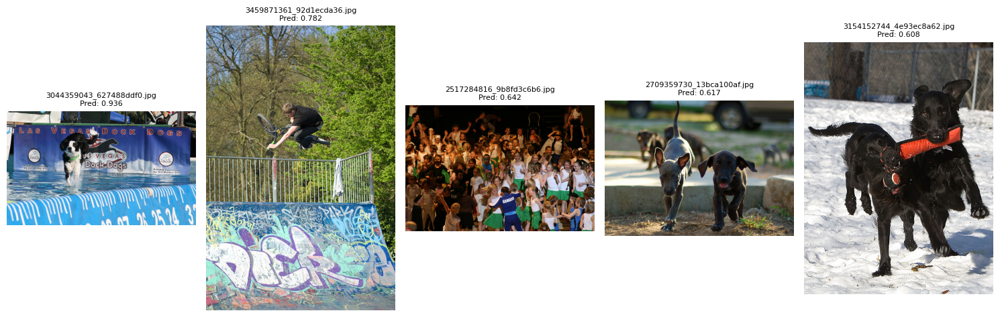



Запрос: A girl in a bikini top and shorts poses for a picture on a mountain overlooking a lake .

This image is unavailable in your country in compliance with local laws


Запрос: Little boy standing on the bank of a river .

This image is unavailable in your country in compliance with local laws


Запрос: A group of people are playing with a large red ring .



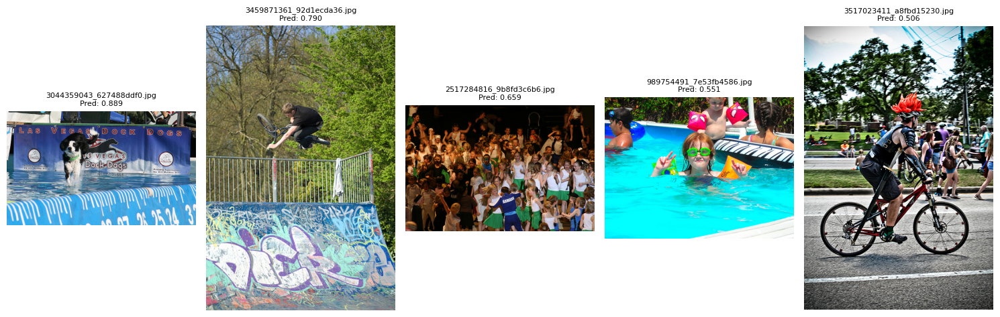



Запрос: A playground with two children and an adult .

This image is unavailable in your country in compliance with local laws


Запрос: The woman lacrosse player in blue is about to catch the ball .



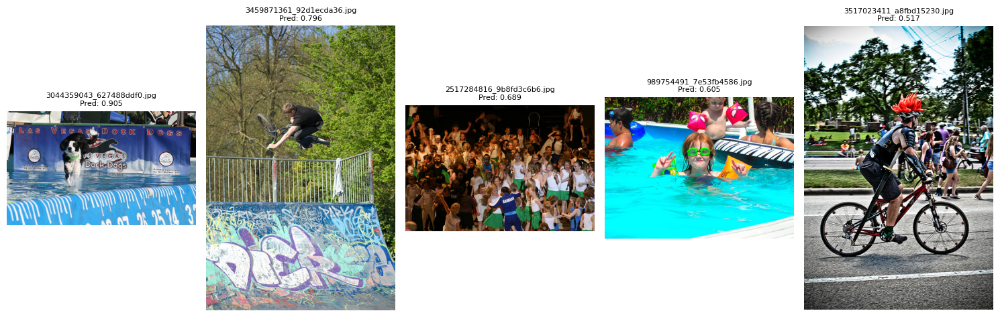



Запрос: Two young girls on a playground .

This image is unavailable in your country in compliance with local laws


Запрос: A child in a green and white sports uniform is running over grass .

This image is unavailable in your country in compliance with local laws


Запрос: Boy wearing a green and white soccer uniform running through the grass .

This image is unavailable in your country in compliance with local laws


Запрос: A woman and a younger girl , both wearing blue jackets and knit caps , slide down a hill on a snow sled , a dog running at their side .

This image is unavailable in your country in compliance with local laws


In [87]:
random.seed(2026)  # фиксируем seed
rand_list = random.sample(range(100), 10)

for i in rand_list:
    find_and_show_top_images(i)

**Промежуточный итог:**

Поиск картинки по описанию работает. Модель находит наиболее релевантные фотографии по описанию. Однако качество поиска низкое. На представленных фотографиях имеются отдельные элементы, удовлетворяющие запросу, но нет фотографии, которая удовлетворяла бы запросу полностью.

## Выводы

В рамках проекта была создана демонстрационная система поиска изображений по текстовому описанию для профессиональных фотографов.

Данные были успешно загружены и предварительно обработаны: добавлены признаки, объединены в удобные датасеты, очищены в соответствии с законодательством. 

Изображения и текстовые описания были векторизованы: для изображений использовалась ResNet50, для текстов - Word2Vec. 
Были обучены две модели: линейная регрессия и полносвязная нейронная сеть. 
Основной метрикой качества была MAE относительно экспертной оценки.

Полносвязная сеть показала наилучшую предсказательную способность с MAE = 0.1783. Модель успешно демонстрирует поиск релевантных изображений по текстовым запросам, однако качество поиска пока остается низким. 

**Рекомендации**

* Для повышения качества запросов, необходимо увеличить выборку с точными описаниями фотографий, где оценки экспертов будут высокими.

 * Попробовать другие методы векторизации текстов.


**Заключение**

Проект подтверждает возможность создания эффективного инструмента поиска референсов по описанию, который учитывает семантику текста и визуальные особенности изображений, и при этом соблюдает юридические ограничения.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска